<img src="..\..\assets\maco7.png" align="left" style='width:1000px'/>
 
<br></br>
<br></br>
<br></br>
<br></br>
<br></br>

<h1>Tutorial : inspect results</h1><hr style="border-width:2px;border-color:black">



<span>
    This notebook shows the results obtained on the test set with the trained model.
</span>

<ol>
    <li> Compose images of two classes  </li>
    <li> Select a few classes to build a light taco dataset</li>
    <li> Merge the two datasets in a single one</li>
    <li> Imbalanced data : resampling dataset</li>
    <li> Split the final dataset into train/val/test sets</li>
</ol>

In [1]:
import os
import sys
import itertools
import math
import logging
import json
import re
import random
from collections import OrderedDict
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon
from pathlib import Path
import tensorflow as tf

# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from src.mrcnn import utils
from src.mrcnn import visualize
from src.mrcnn.visualize import display_images
import src.mrcnn.model as modellib
from src.mrcnn.model import log
from src.mrcnn.config_cig_and_mask import CigaretteMaskConfig, CocoLikeDataset

%matplotlib inline

def get_ax(rows=1, cols=1, size=16):
  """Return a Matplotlib Axes array to be used in
  all visualizations in the notebook. Provide a
  central point to control graph sizes.

  Adjust the size attribute to control how big to render images
  """
  _, ax = plt.subplots(rows, cols, figsize=(size * cols, size * rows))
  return ax

Images: 95
Classes: ['BG', 'plastic film', 'clear plastic bottle', 'plastic bottle cap', 'broken glass', 'drink can', 'cigarette', 'mask']

Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
DETECTION_SCORE_RATIO          True
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                15
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'

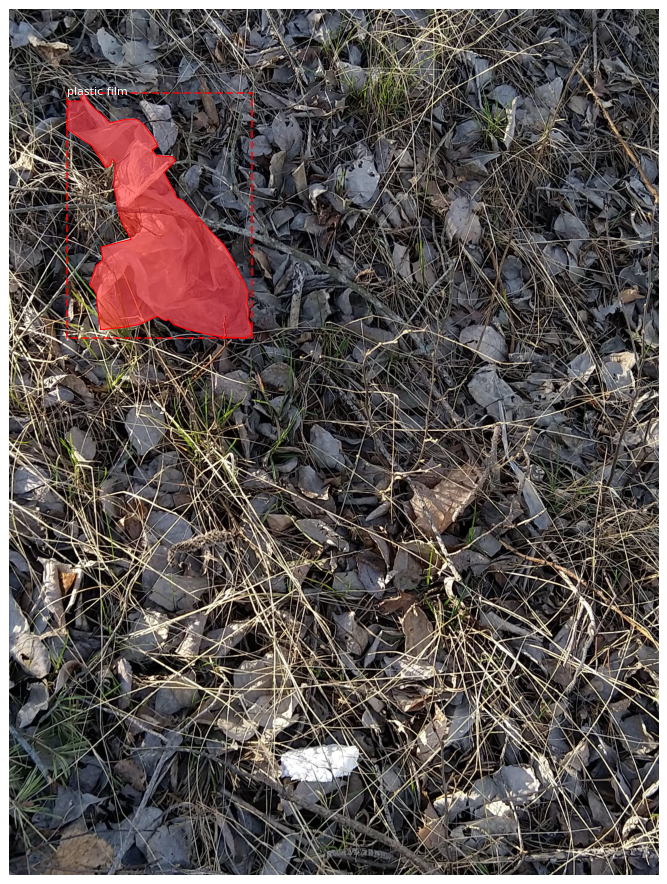

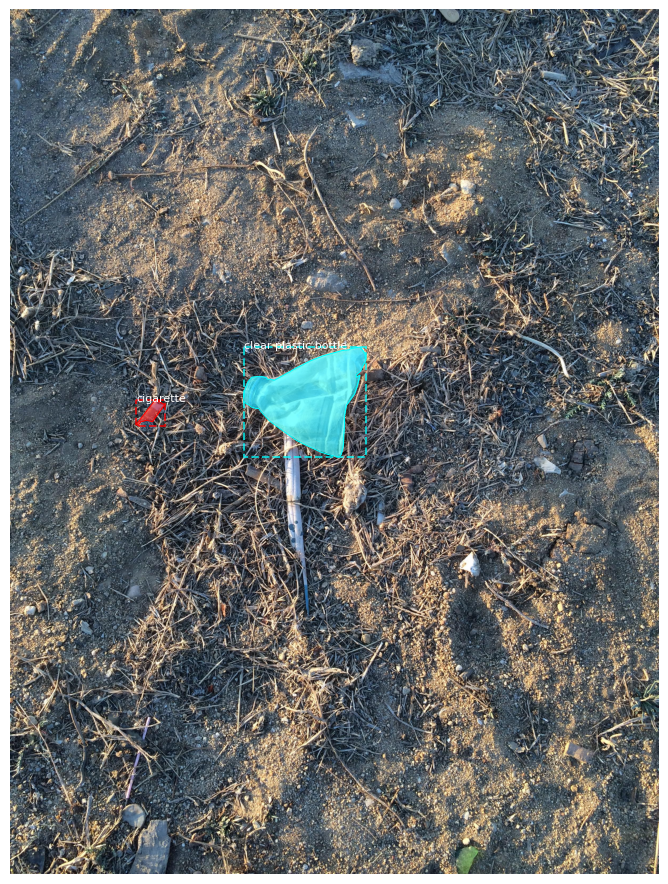

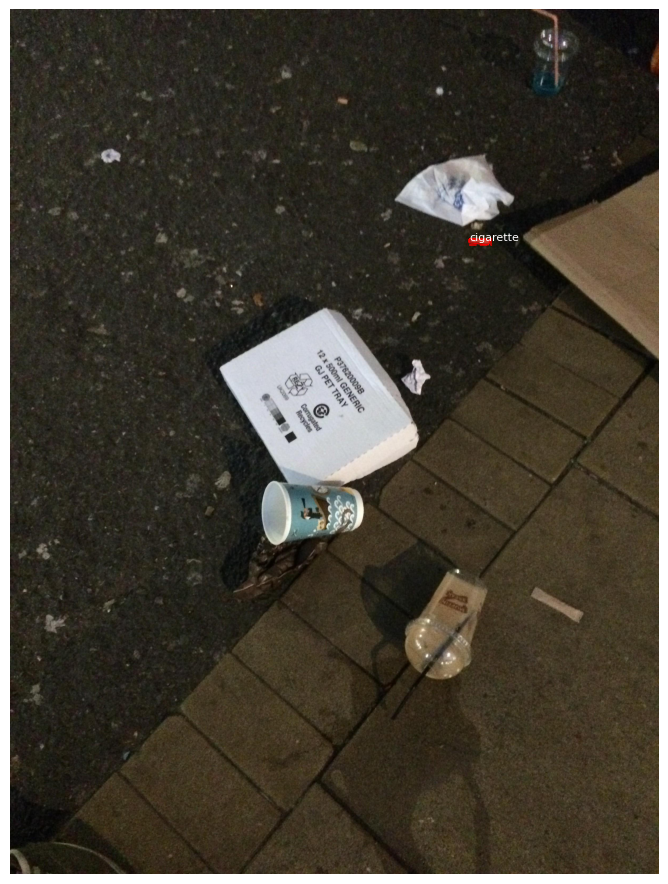

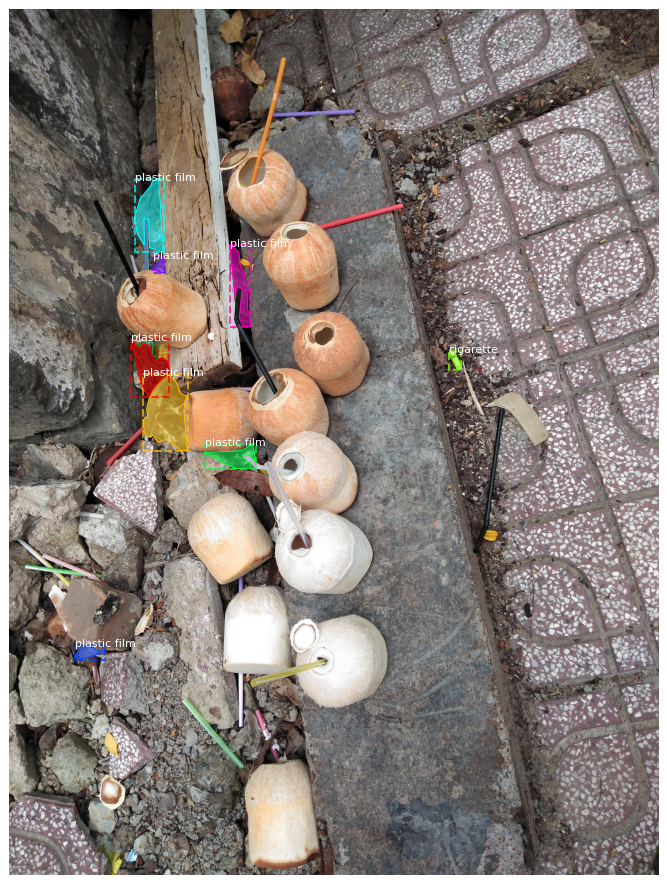

In [12]:
TRASH_DIR = os.path.join(ROOT_DIR, "datasets/taco_split")
# Load dataset
dataset_test = CocoLikeDataset(silent=True)
json_file = os.path.join(TRASH_DIR, "annotations/coco_annotations_test.json")
img_dir = Path(os.path.join(TRASH_DIR, "images/test"))

if (not img_dir.exists()):
    raise AssertionError("Images directory is not found at {}".format(img_dir))
dataset_test.load_data(json_file, img_dir)
dataset_test.prepare()
if (len(dataset_test.image_ids)==0):
    raise Exception("Le nombre d'images du test set est nul")
nr_classes = dataset_test.num_classes

print("Images: {}\nClasses: {}".format(len(dataset_test.image_ids), dataset_test.class_names))

config = CigaretteMaskConfig()
# Override the training configurations with a few changes for inferencing.
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    USE_MINI_MASK = False

config = InferenceConfig()
config.display()

# define image id
image_ids = np.random.choice(dataset_test.image_ids, 4)
for image_id in image_ids:
    # load the image
    image = dataset_test.load_image(image_id)
    # load the masks and the class ids
    mask, class_ids = dataset_test.load_mask(image_id)
    # extract bounding boxes from the masks
    bbox = utils.extract_bboxes(mask)
    # display image with masks and bounding boxes
    visualize.display_instances(image, bbox, mask, class_ids, dataset_test.class_names)

In [8]:
# Load weights
MODEL_DIR = "../../weights/logs"
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,config=config)
model.load_weights(model.find_last(), by_name=True)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Re-starting from epoch 25


image ID: coco_like.365 (29) 
Processing 1 images
image                    shape: (512, 512, 3)         min: -123.70000  max:  151.10000  float64
molded_images            shape: (1, 512, 512, 3)      min: -247.40000  max:   47.20001  float64
image_metas              shape: (1, 15)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
image ID: coco_like.708 (83) 
Processing 1 images
image                    shape: (512, 512, 3)         min: -123.70000  max:  151.10000  float64
molded_images            shape: (1, 512, 512, 3)      min: -247.40000  max:   47.20001  float64
image_metas              shape: (1, 15)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
image ID: coco_like.1106 (34) 
Processing 1 images
image                    shape: (512, 512, 3)         min: -123.70000  max:  151.1000

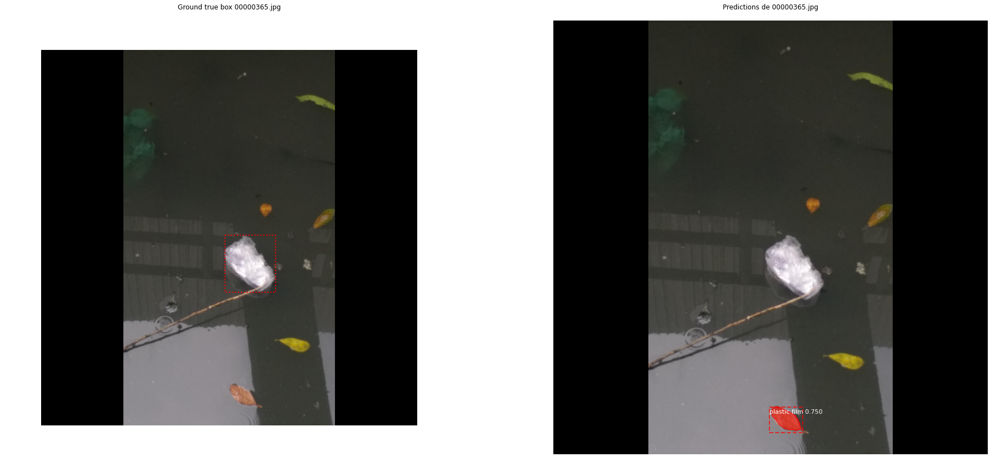

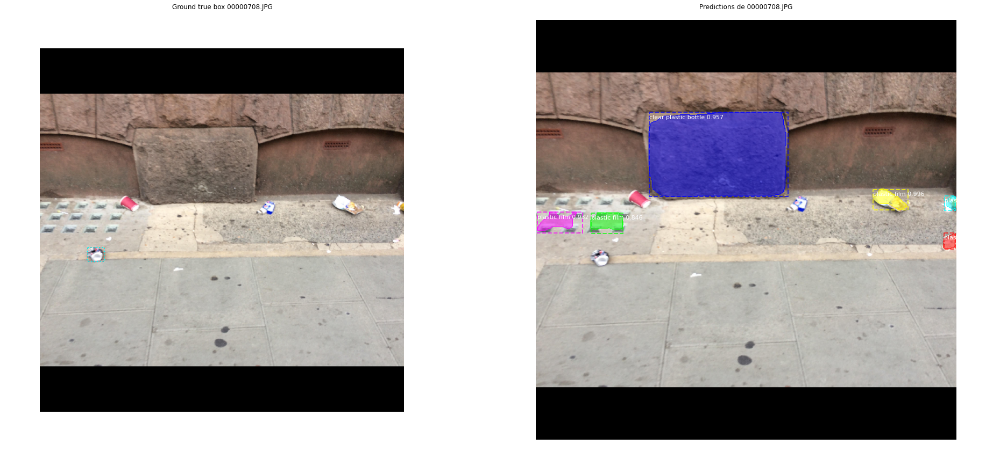

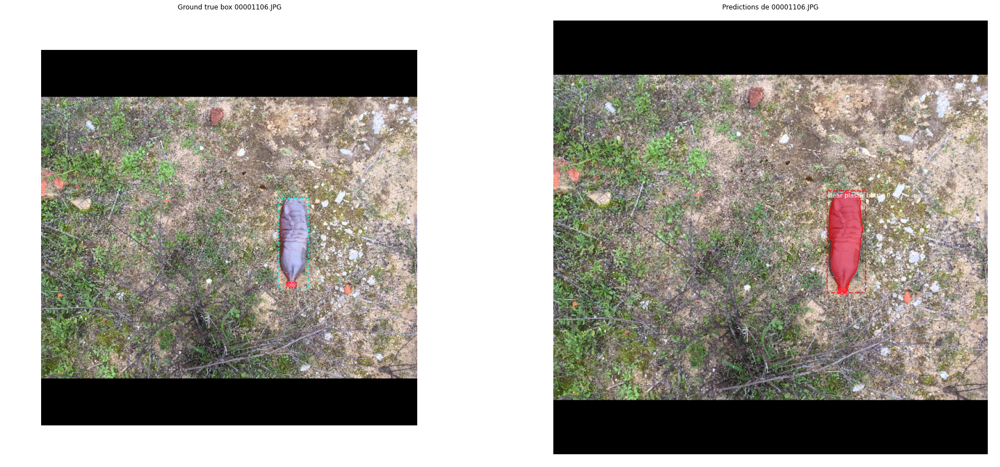

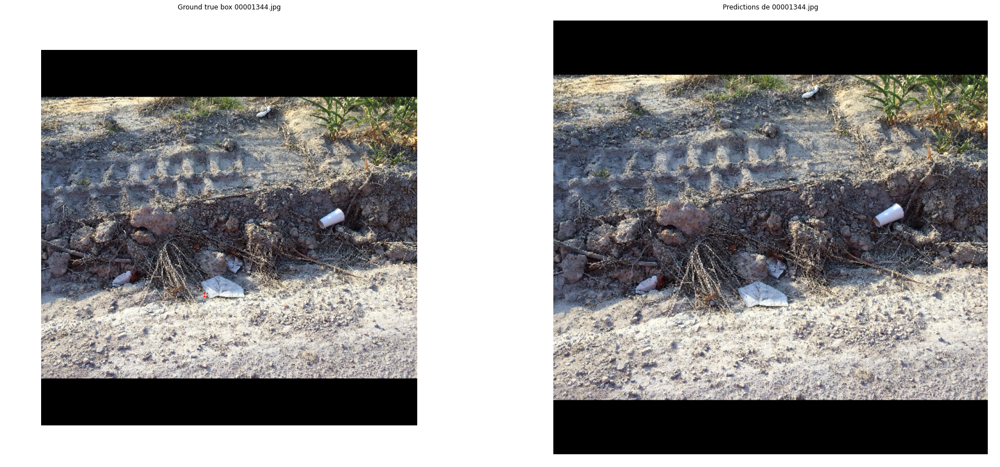

In [14]:
image_ids = np.random.choice(dataset_test.image_ids, 4)
for image_id in image_ids:
    image, image_meta, gt_class_id, gt_bbox, gt_mask = modellib.load_image_gt(dataset_test, config, image_id)
    # image and mask have been resized in load_image_gt
    info = dataset_test.image_info[image_id]

    print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                           dataset_test.image_reference(image_id)))
  
    # convert pixel values (e.g. center)
    scaled_image = modellib.mold_image(image, config)
    
    # Run object detection
    results = model.detect([scaled_image], verbose=1)

    # Display results
    ax = get_ax(1, 2)
    visualize.draw_boxes(
        image, 
        boxes=gt_bbox,
        title="Ground true box "+info['name'],
        ax=ax[0])

    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                dataset_test.class_names, r['scores'], ax=ax[1],
                                title="Predictions de "+info['name'],show_mask=True)
#     log("gt_class_id", gt_class_id)
#     log("gt_bbox", gt_bbox)
#     log("gt_mask", gt_mask)